# 🧱 DCGAN - Bricks Data

In this notebook, we'll walk through the steps required to train your own DCGAN on the bricks dataset

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    losses,
    utils,
    metrics,
    optimizers,
)

import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../../..')))
from notebooks.utils import display, sample_batch

## 0. Parameters <a name="parameters"></a>

In [2]:
IMAGE_SIZE = 64
CHANNELS = 1
BATCH_SIZE = 128
Z_DIM = 100
EPOCHS = 100
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
D_LEARNING_RATE = 0.0002
G_LEARNING_RATE = 0.0002
NOISE_PARAM = 0.1
DROPOUT_RATE = 0.3

## 1. Prepare the data <a name="prepare"></a>

In [3]:
train_data = utils.image_dataset_from_directory(
    "../../../data/lego-brick-images/dataset/",
    labels=None,
    color_mode="grayscale",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 40000 files belonging to 1 classes.


In [4]:
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(lambda x: preprocess(x))

In [5]:
train_sample = sample_batch(train)

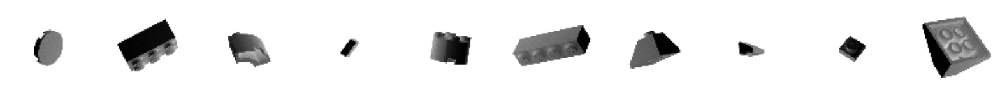

In [6]:
display(train_sample)

## 2. Build the GAN <a name="build"></a>

In [7]:
discriminator_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same", use_bias=False)(
    discriminator_input
)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(DROPOUT_RATE)(x)
x = layers.Conv2D(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(DROPOUT_RATE)(x)
x = layers.Conv2D(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(DROPOUT_RATE)(x)
x = layers.Conv2D(
    512, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(DROPOUT_RATE)(x)
x = layers.Conv2D(
    1,
    kernel_size=4,
    strides=1,
    padding="valid",
    use_bias=False,
    activation="sigmoid",
)(x)
discriminator_output = layers.Flatten()(x)

discriminator = models.Model(discriminator_input, discriminator_output)
discriminator.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        1024      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131072    
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 128)      512       
 ormalization)                                                   
                                                             

In [8]:
generator_input = layers.Input(shape=(Z_DIM,))
x = layers.Reshape((1, 1, Z_DIM))(generator_input)
x = layers.Conv2DTranspose(
    512, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    CHANNELS,
    kernel_size=4,
    strides=2,
    padding="same",
    use_bias=False,
    activation="tanh",
)(x)
generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 reshape (Reshape)           (None, 1, 1, 100)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 4, 4, 512)        819200    
 nspose)                                                         
                                                                 
 batch_normalization_3 (Batc  (None, 4, 4, 512)        2048      
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 8, 8, 256)        2097

In [9]:
class DCGAN(models.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer):
        super(DCGAN, self).compile()
        self.loss_fn = losses.BinaryCrossentropy()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_metric = metrics.Mean(name="d_loss")
        self.d_real_acc_metric = metrics.BinaryAccuracy(name="d_real_acc")
        self.d_fake_acc_metric = metrics.BinaryAccuracy(name="d_fake_acc")
        self.d_acc_metric = metrics.BinaryAccuracy(name="d_acc")
        self.g_loss_metric = metrics.Mean(name="g_loss")
        self.g_acc_metric = metrics.BinaryAccuracy(name="g_acc")

    @property
    def metrics(self):
        return [
            self.d_loss_metric,
            self.d_real_acc_metric,
            self.d_fake_acc_metric,
            self.d_acc_metric,
            self.g_loss_metric,
            self.g_acc_metric,
        ]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )

        # Train the discriminator on fake images
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated_images = self.generator(
                random_latent_vectors, training=True
            )
            real_predictions = self.discriminator(real_images, training=True)
            fake_predictions = self.discriminator(
                generated_images, training=True
            )

            real_labels = tf.ones_like(real_predictions)
            real_noisy_labels = real_labels + NOISE_PARAM * tf.random.uniform(
                tf.shape(real_predictions)
            )
            fake_labels = tf.zeros_like(fake_predictions)
            fake_noisy_labels = fake_labels - NOISE_PARAM * tf.random.uniform(
                tf.shape(fake_predictions)
            )

            d_real_loss = self.loss_fn(real_noisy_labels, real_predictions)
            d_fake_loss = self.loss_fn(fake_noisy_labels, fake_predictions)
            d_loss = (d_real_loss + d_fake_loss) / 2.0

            g_loss = self.loss_fn(real_labels, fake_predictions)

        gradients_of_discriminator = disc_tape.gradient(
            d_loss, self.discriminator.trainable_variables
        )
        gradients_of_generator = gen_tape.gradient(
            g_loss, self.generator.trainable_variables
        )

        self.d_optimizer.apply_gradients(
            zip(gradients_of_discriminator, discriminator.trainable_variables)
        )
        self.g_optimizer.apply_gradients(
            zip(gradients_of_generator, generator.trainable_variables)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.d_real_acc_metric.update_state(real_labels, real_predictions)
        self.d_fake_acc_metric.update_state(fake_labels, fake_predictions)
        self.d_acc_metric.update_state(
            [real_labels, fake_labels], [real_predictions, fake_predictions]
        )
        self.g_loss_metric.update_state(g_loss)
        self.g_acc_metric.update_state(real_labels, fake_predictions)

        return {m.name: m.result() for m in self.metrics}

In [10]:
# Create a DCGAN
dcgan = DCGAN(
    discriminator=discriminator, generator=generator, latent_dim=Z_DIM
)

In [11]:
if LOAD_MODEL:
    dcgan.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [12]:
dcgan.compile(
    d_optimizer=optimizers.Adam(
        learning_rate=D_LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=G_LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [13]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d.png" % (epoch),
        )

Epoch 1/100
313/313 [==============================] - ETA: 0s - d_loss: 0.3113 - d_real_acc: 0.8230 - d_fake_acc: 0.8318 - d_acc: 0.8274 - g_loss: 3.6138 - g_acc: 0.1682  
Saved to ./output/generated_img_000.png


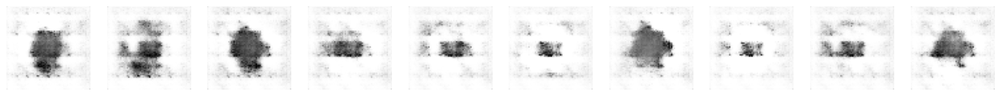

313/313 [==============================] - 45s 127ms/step - d_loss: 0.3113 - d_real_acc: 0.8230 - d_fake_acc: 0.8318 - d_acc: 0.8274 - g_loss: 3.6138 - g_acc: 0.1682
Epoch 2/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0795 - d_real_acc: 0.8911 - d_fake_acc: 0.8961 - d_acc: 0.8936 - g_loss: 4.3635 - g_acc: 0.1039  
Saved to ./output/generated_img_001.png


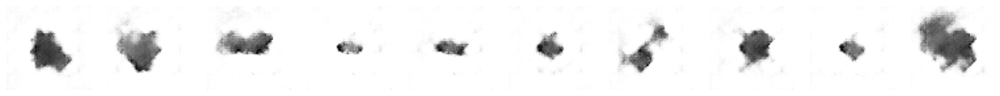

313/313 [==============================] - 40s 126ms/step - d_loss: 0.0795 - d_real_acc: 0.8911 - d_fake_acc: 0.8961 - d_acc: 0.8936 - g_loss: 4.3635 - g_acc: 0.1039
Epoch 3/100
313/313 [==============================] - ETA: 0s - d_loss: 0.1835 - d_real_acc: 0.8618 - d_fake_acc: 0.8656 - d_acc: 0.8637 - g_loss: 4.0605 - g_acc: 0.1344  
Saved to ./output/generated_img_002.png


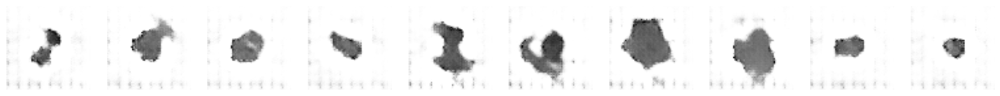

313/313 [==============================] - 40s 127ms/step - d_loss: 0.1835 - d_real_acc: 0.8618 - d_fake_acc: 0.8656 - d_acc: 0.8637 - g_loss: 4.0605 - g_acc: 0.1344
Epoch 4/100
313/313 [==============================] - ETA: 0s - d_loss: 0.1377 - d_real_acc: 0.8707 - d_fake_acc: 0.8730 - d_acc: 0.8719 - g_loss: 4.4355 - g_acc: 0.1270      
Saved to ./output/generated_img_003.png


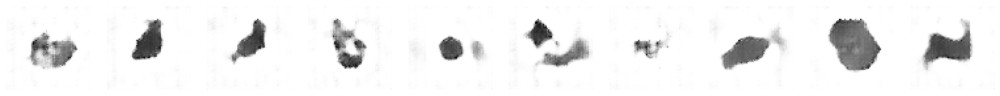

313/313 [==============================] - 40s 127ms/step - d_loss: 0.1377 - d_real_acc: 0.8707 - d_fake_acc: 0.8730 - d_acc: 0.8719 - g_loss: 4.4355 - g_acc: 0.1270
Epoch 5/100
313/313 [==============================] - ETA: 0s - d_loss: 0.1312 - d_real_acc: 0.8738 - d_fake_acc: 0.8758 - d_acc: 0.8748 - g_loss: 4.1224 - g_acc: 0.1242       
Saved to ./output/generated_img_004.png


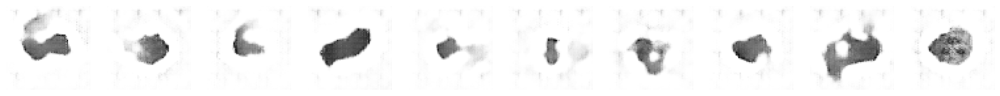

313/313 [==============================] - 40s 127ms/step - d_loss: 0.1312 - d_real_acc: 0.8738 - d_fake_acc: 0.8758 - d_acc: 0.8748 - g_loss: 4.1224 - g_acc: 0.1242
Epoch 6/100
313/313 [==============================] - ETA: 0s - d_loss: 0.1420 - d_real_acc: 0.8751 - d_fake_acc: 0.8768 - d_acc: 0.8759 - g_loss: 3.9621 - g_acc: 0.1232  
Saved to ./output/generated_img_005.png


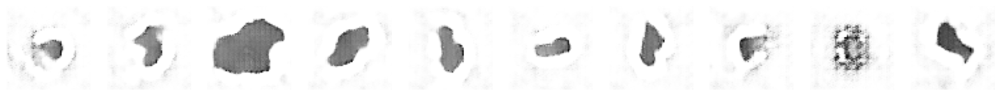

313/313 [==============================] - 40s 128ms/step - d_loss: 0.1420 - d_real_acc: 0.8751 - d_fake_acc: 0.8768 - d_acc: 0.8759 - g_loss: 3.9621 - g_acc: 0.1232
Epoch 7/100
313/313 [==============================] - ETA: 0s - d_loss: 0.1045 - d_real_acc: 0.8881 - d_fake_acc: 0.8890 - d_acc: 0.8886 - g_loss: 4.1254 - g_acc: 0.1110       
Saved to ./output/generated_img_006.png


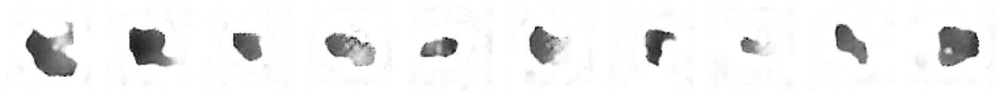

313/313 [==============================] - 40s 127ms/step - d_loss: 0.1045 - d_real_acc: 0.8881 - d_fake_acc: 0.8890 - d_acc: 0.8886 - g_loss: 4.1254 - g_acc: 0.1110
Epoch 8/100
313/313 [==============================] - ETA: 0s - d_loss: 0.1106 - d_real_acc: 0.8830 - d_fake_acc: 0.8801 - d_acc: 0.8816 - g_loss: 4.5033 - g_acc: 0.1199      
Saved to ./output/generated_img_007.png


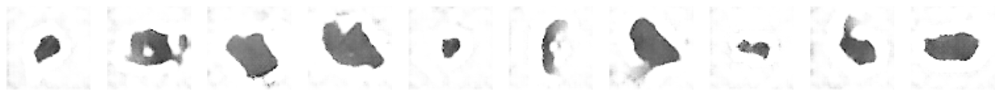

313/313 [==============================] - 40s 127ms/step - d_loss: 0.1106 - d_real_acc: 0.8830 - d_fake_acc: 0.8801 - d_acc: 0.8816 - g_loss: 4.5033 - g_acc: 0.1199
Epoch 9/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0417 - d_real_acc: 0.9043 - d_fake_acc: 0.9050 - d_acc: 0.9046 - g_loss: 4.5688 - g_acc: 0.0950      
Saved to ./output/generated_img_008.png


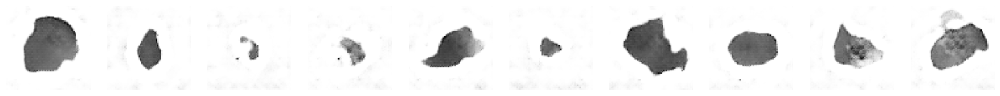

313/313 [==============================] - 40s 127ms/step - d_loss: 0.0417 - d_real_acc: 0.9043 - d_fake_acc: 0.9050 - d_acc: 0.9046 - g_loss: 4.5688 - g_acc: 0.0950
Epoch 10/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0935 - d_real_acc: 0.8909 - d_fake_acc: 0.8927 - d_acc: 0.8918 - g_loss: 4.5332 - g_acc: 0.1073       
Saved to ./output/generated_img_009.png


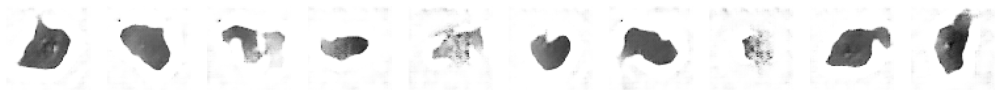

313/313 [==============================] - 40s 128ms/step - d_loss: 0.0935 - d_real_acc: 0.8909 - d_fake_acc: 0.8927 - d_acc: 0.8918 - g_loss: 4.5332 - g_acc: 0.1073
Epoch 11/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0612 - d_real_acc: 0.8957 - d_fake_acc: 0.9000 - d_acc: 0.8978 - g_loss: 4.7455 - g_acc: 0.1000       
Saved to ./output/generated_img_010.png


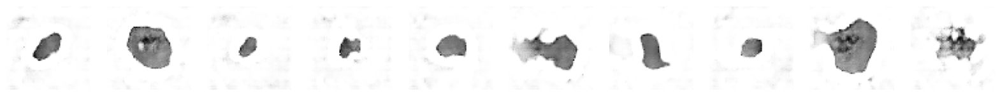

313/313 [==============================] - 40s 127ms/step - d_loss: 0.0612 - d_real_acc: 0.8957 - d_fake_acc: 0.9000 - d_acc: 0.8978 - g_loss: 4.7455 - g_acc: 0.1000
Epoch 12/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0255 - d_real_acc: 0.9065 - d_fake_acc: 0.9077 - d_acc: 0.9071 - g_loss: 5.0779 - g_acc: 0.0923     
Saved to ./output/generated_img_011.png


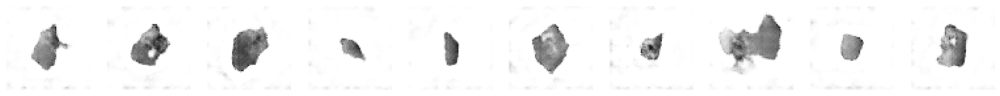

313/313 [==============================] - 40s 127ms/step - d_loss: 0.0255 - d_real_acc: 0.9065 - d_fake_acc: 0.9077 - d_acc: 0.9071 - g_loss: 5.0779 - g_acc: 0.0923
Epoch 13/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0161 - d_real_acc: 0.9065 - d_fake_acc: 0.9092 - d_acc: 0.9078 - g_loss: 4.9955 - g_acc: 0.0908      
Saved to ./output/generated_img_012.png


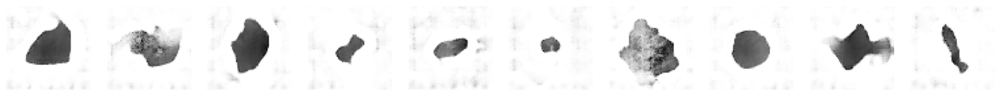

313/313 [==============================] - 40s 128ms/step - d_loss: 0.0161 - d_real_acc: 0.9065 - d_fake_acc: 0.9092 - d_acc: 0.9078 - g_loss: 4.9955 - g_acc: 0.0908
Epoch 14/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0148 - d_real_acc: 0.9096 - d_fake_acc: 0.9108 - d_acc: 0.9102 - g_loss: 5.1543 - g_acc: 0.0892      
Saved to ./output/generated_img_013.png


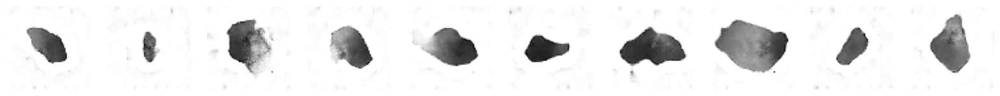

313/313 [==============================] - 40s 128ms/step - d_loss: 0.0148 - d_real_acc: 0.9096 - d_fake_acc: 0.9108 - d_acc: 0.9102 - g_loss: 5.1543 - g_acc: 0.0892
Epoch 15/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0272 - d_real_acc: 0.9099 - d_fake_acc: 0.9111 - d_acc: 0.9105 - g_loss: 5.3593 - g_acc: 0.0889       
Saved to ./output/generated_img_014.png


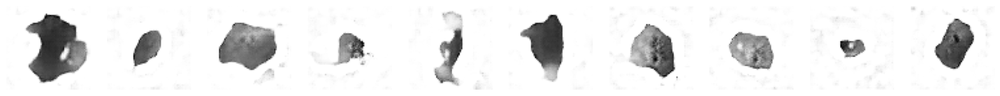

313/313 [==============================] - 44s 139ms/step - d_loss: 0.0272 - d_real_acc: 0.9099 - d_fake_acc: 0.9111 - d_acc: 0.9105 - g_loss: 5.3593 - g_acc: 0.0889
Epoch 16/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0127 - d_real_acc: 0.9159 - d_fake_acc: 0.9168 - d_acc: 0.9163 - g_loss: 5.4377 - g_acc: 0.0832      
Saved to ./output/generated_img_015.png


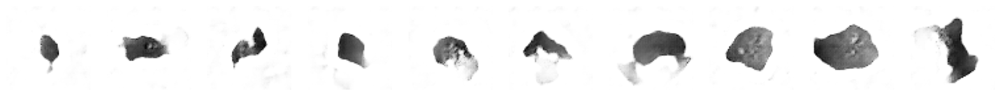

313/313 [==============================] - 40s 128ms/step - d_loss: 0.0127 - d_real_acc: 0.9159 - d_fake_acc: 0.9168 - d_acc: 0.9163 - g_loss: 5.4377 - g_acc: 0.0832
Epoch 17/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0387 - d_real_acc: 0.9275 - d_fake_acc: 0.9302 - d_acc: 0.9288 - g_loss: 5.6663 - g_acc: 0.0698    
Saved to ./output/generated_img_016.png


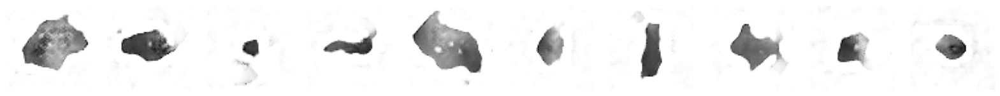

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0387 - d_real_acc: 0.9275 - d_fake_acc: 0.9302 - d_acc: 0.9288 - g_loss: 5.6663 - g_acc: 0.0698
Epoch 18/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0138 - d_real_acc: 0.9159 - d_fake_acc: 0.9193 - d_acc: 0.9176 - g_loss: 5.9613 - g_acc: 0.0808  
Saved to ./output/generated_img_017.png


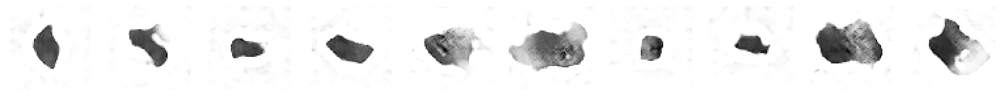

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0138 - d_real_acc: 0.9159 - d_fake_acc: 0.9193 - d_acc: 0.9176 - g_loss: 5.9613 - g_acc: 0.0808
Epoch 19/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0714 - d_real_acc: 0.9403 - d_fake_acc: 0.9416 - d_acc: 0.9409 - g_loss: 6.1082 - g_acc: 0.0584    
Saved to ./output/generated_img_018.png


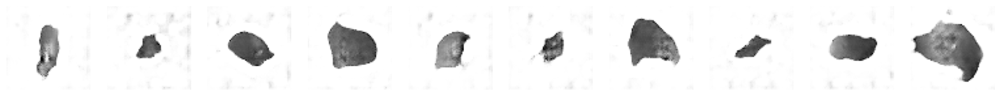

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0714 - d_real_acc: 0.9403 - d_fake_acc: 0.9416 - d_acc: 0.9409 - g_loss: 6.1082 - g_acc: 0.0584
Epoch 20/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0959 - d_real_acc: 0.9427 - d_fake_acc: 0.9423 - d_acc: 0.9425 - g_loss: 6.4401 - g_acc: 0.0577  
Saved to ./output/generated_img_019.png


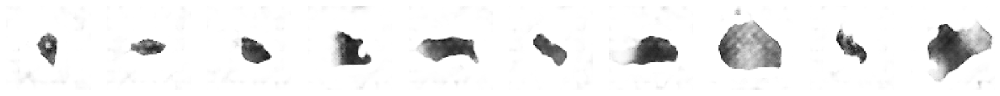

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0959 - d_real_acc: 0.9427 - d_fake_acc: 0.9423 - d_acc: 0.9425 - g_loss: 6.4401 - g_acc: 0.0577
Epoch 21/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0731 - d_real_acc: 0.9320 - d_fake_acc: 0.9352 - d_acc: 0.9336 - g_loss: 6.3620 - g_acc: 0.0648  
Saved to ./output/generated_img_020.png


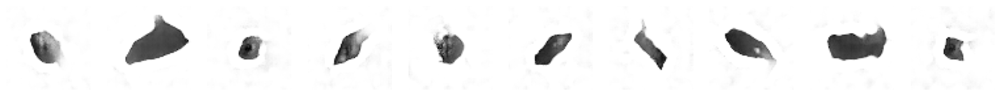

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0731 - d_real_acc: 0.9320 - d_fake_acc: 0.9352 - d_acc: 0.9336 - g_loss: 6.3620 - g_acc: 0.0648
Epoch 22/100
313/313 [==============================] - ETA: 0s - d_loss: -0.1253 - d_real_acc: 0.9436 - d_fake_acc: 0.9441 - d_acc: 0.9438 - g_loss: 6.6364 - g_acc: 0.0559 
Saved to ./output/generated_img_021.png


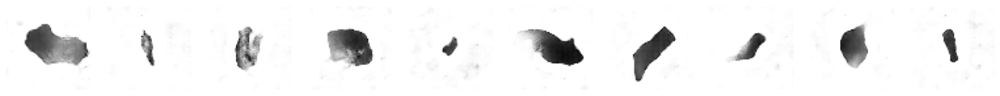

313/313 [==============================] - 40s 128ms/step - d_loss: -0.1253 - d_real_acc: 0.9436 - d_fake_acc: 0.9441 - d_acc: 0.9438 - g_loss: 6.6364 - g_acc: 0.0559
Epoch 23/100
313/313 [==============================] - ETA: 0s - d_loss: 0.2368 - d_real_acc: 0.8991 - d_fake_acc: 0.9430 - d_acc: 0.9211 - g_loss: 7.4861 - g_acc: 0.0570      
Saved to ./output/generated_img_022.png


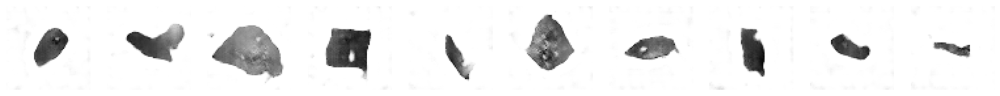

313/313 [==============================] - 40s 128ms/step - d_loss: 0.2368 - d_real_acc: 0.8991 - d_fake_acc: 0.9430 - d_acc: 0.9211 - g_loss: 7.4861 - g_acc: 0.0570
Epoch 24/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0582 - d_real_acc: 0.9350 - d_fake_acc: 0.9348 - d_acc: 0.9349 - g_loss: 6.4087 - g_acc: 0.0652     
Saved to ./output/generated_img_023.png


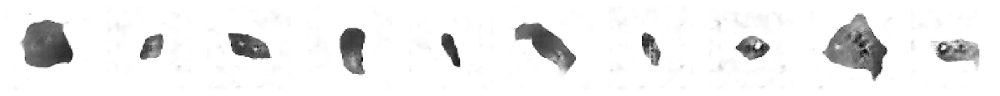

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0582 - d_real_acc: 0.9350 - d_fake_acc: 0.9348 - d_acc: 0.9349 - g_loss: 6.4087 - g_acc: 0.0652
Epoch 25/100
313/313 [==============================] - ETA: 0s - d_loss: 0.1182 - d_real_acc: 0.8871 - d_fake_acc: 0.8863 - d_acc: 0.8867 - g_loss: 6.1751 - g_acc: 0.1137   
Saved to ./output/generated_img_024.png


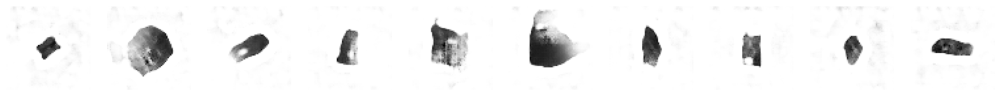

313/313 [==============================] - 40s 128ms/step - d_loss: 0.1182 - d_real_acc: 0.8871 - d_fake_acc: 0.8863 - d_acc: 0.8867 - g_loss: 6.1751 - g_acc: 0.1137
Epoch 26/100
313/313 [==============================] - ETA: 0s - d_loss: -0.1845 - d_real_acc: 0.9512 - d_fake_acc: 0.9521 - d_acc: 0.9517 - g_loss: 7.5200 - g_acc: 0.0479      
Saved to ./output/generated_img_025.png


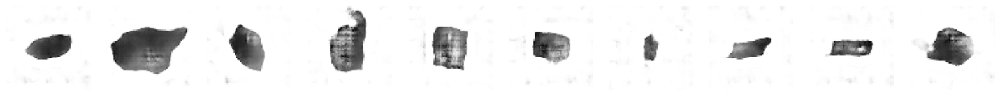

313/313 [==============================] - 40s 128ms/step - d_loss: -0.1845 - d_real_acc: 0.9512 - d_fake_acc: 0.9521 - d_acc: 0.9517 - g_loss: 7.5200 - g_acc: 0.0479
Epoch 27/100
313/313 [==============================] - ETA: 0s - d_loss: -0.1723 - d_real_acc: 0.9502 - d_fake_acc: 0.9504 - d_acc: 0.9503 - g_loss: 7.5150 - g_acc: 0.0496  
Saved to ./output/generated_img_026.png


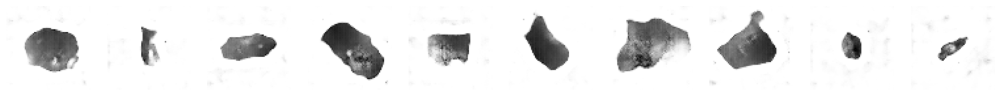

313/313 [==============================] - 40s 128ms/step - d_loss: -0.1723 - d_real_acc: 0.9502 - d_fake_acc: 0.9504 - d_acc: 0.9503 - g_loss: 7.5150 - g_acc: 0.0496
Epoch 28/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0680 - d_real_acc: 0.9258 - d_fake_acc: 0.9291 - d_acc: 0.9274 - g_loss: 6.9605 - g_acc: 0.0710       
Saved to ./output/generated_img_027.png


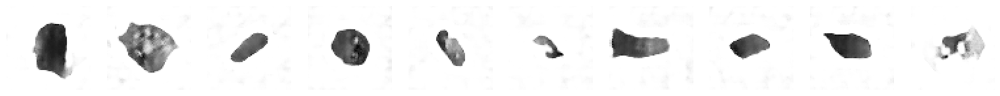

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0680 - d_real_acc: 0.9258 - d_fake_acc: 0.9291 - d_acc: 0.9274 - g_loss: 6.9605 - g_acc: 0.0710
Epoch 29/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0215 - d_real_acc: 0.9239 - d_fake_acc: 0.9245 - d_acc: 0.9242 - g_loss: 6.9121 - g_acc: 0.0755     
Saved to ./output/generated_img_028.png


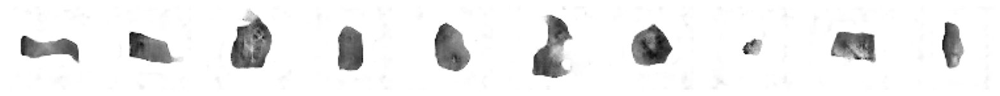

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0215 - d_real_acc: 0.9239 - d_fake_acc: 0.9245 - d_acc: 0.9242 - g_loss: 6.9121 - g_acc: 0.0755
Epoch 30/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2025 - d_real_acc: 0.9509 - d_fake_acc: 0.9504 - d_acc: 0.9506 - g_loss: 8.0988 - g_acc: 0.0496  
Saved to ./output/generated_img_029.png


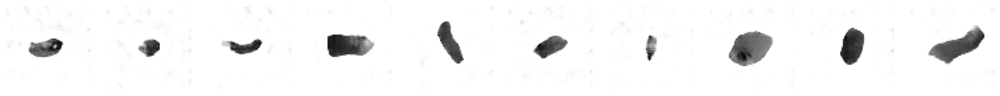

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2025 - d_real_acc: 0.9509 - d_fake_acc: 0.9504 - d_acc: 0.9506 - g_loss: 8.0988 - g_acc: 0.0496
Epoch 31/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2251 - d_real_acc: 0.9538 - d_fake_acc: 0.9564 - d_acc: 0.9551 - g_loss: 8.1963 - g_acc: 0.0436       
Saved to ./output/generated_img_030.png


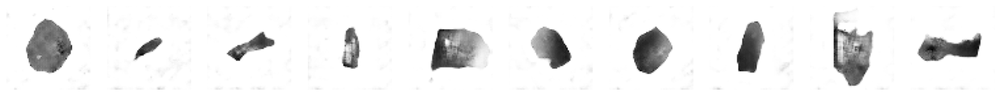

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2251 - d_real_acc: 0.9538 - d_fake_acc: 0.9564 - d_acc: 0.9551 - g_loss: 8.1963 - g_acc: 0.0436
Epoch 32/100
313/313 [==============================] - ETA: 0s - d_loss: -0.1581 - d_real_acc: 0.9409 - d_fake_acc: 0.9427 - d_acc: 0.9418 - g_loss: 8.0399 - g_acc: 0.0573       
Saved to ./output/generated_img_031.png


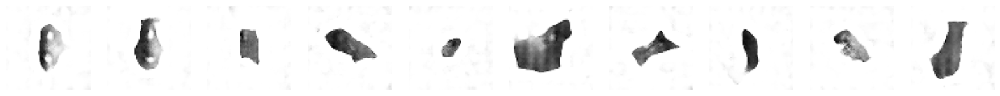

313/313 [==============================] - 40s 128ms/step - d_loss: -0.1581 - d_real_acc: 0.9409 - d_fake_acc: 0.9427 - d_acc: 0.9418 - g_loss: 8.0399 - g_acc: 0.0573
Epoch 33/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2565 - d_real_acc: 0.9605 - d_fake_acc: 0.9620 - d_acc: 0.9612 - g_loss: 8.4428 - g_acc: 0.0380      
Saved to ./output/generated_img_032.png


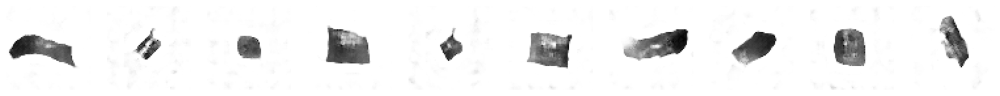

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2565 - d_real_acc: 0.9605 - d_fake_acc: 0.9620 - d_acc: 0.9612 - g_loss: 8.4428 - g_acc: 0.0380
Epoch 34/100
313/313 [==============================] - ETA: 0s - d_loss: -0.1734 - d_real_acc: 0.9388 - d_fake_acc: 0.9411 - d_acc: 0.9400 - g_loss: 8.2231 - g_acc: 0.0589     
Saved to ./output/generated_img_033.png


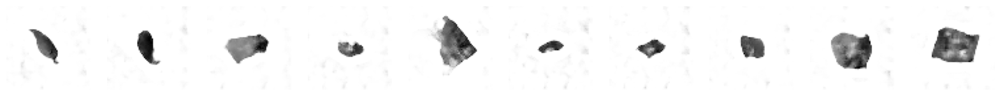

313/313 [==============================] - 40s 128ms/step - d_loss: -0.1734 - d_real_acc: 0.9388 - d_fake_acc: 0.9411 - d_acc: 0.9400 - g_loss: 8.2231 - g_acc: 0.0589
Epoch 35/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2100 - d_real_acc: 0.9512 - d_fake_acc: 0.9529 - d_acc: 0.9520 - g_loss: 8.7563 - g_acc: 0.0471       
Saved to ./output/generated_img_034.png


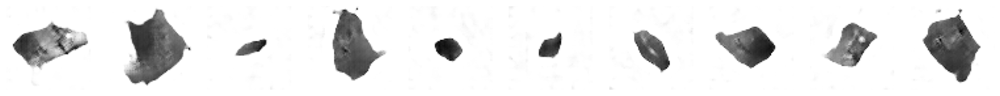

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2100 - d_real_acc: 0.9512 - d_fake_acc: 0.9529 - d_acc: 0.9520 - g_loss: 8.7563 - g_acc: 0.0471
Epoch 36/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3616 - d_real_acc: 0.9631 - d_fake_acc: 0.9677 - d_acc: 0.9654 - g_loss: 10.2614 - g_acc: 0.0323     
Saved to ./output/generated_img_035.png


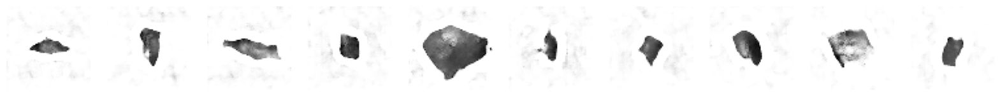

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3616 - d_real_acc: 0.9631 - d_fake_acc: 0.9677 - d_acc: 0.9654 - g_loss: 10.2614 - g_acc: 0.0323
Epoch 37/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3088 - d_real_acc: 0.9606 - d_fake_acc: 0.9622 - d_acc: 0.9614 - g_loss: 9.6158 - g_acc: 0.0378     
Saved to ./output/generated_img_036.png


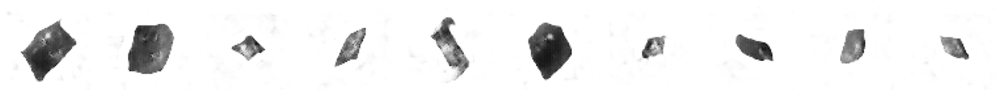

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3088 - d_real_acc: 0.9606 - d_fake_acc: 0.9622 - d_acc: 0.9614 - g_loss: 9.6158 - g_acc: 0.0378
Epoch 38/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2955 - d_real_acc: 0.9546 - d_fake_acc: 0.9570 - d_acc: 0.9558 - g_loss: 9.6589 - g_acc: 0.0430   
Saved to ./output/generated_img_037.png


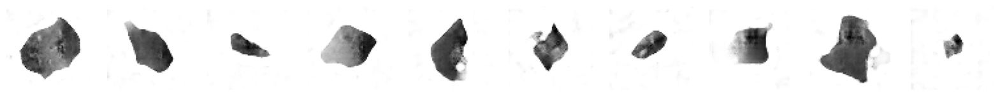

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2955 - d_real_acc: 0.9546 - d_fake_acc: 0.9570 - d_acc: 0.9558 - g_loss: 9.6589 - g_acc: 0.0430
Epoch 39/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2716 - d_real_acc: 0.9527 - d_fake_acc: 0.9549 - d_acc: 0.9538 - g_loss: 9.3735 - g_acc: 0.0450     
Saved to ./output/generated_img_038.png


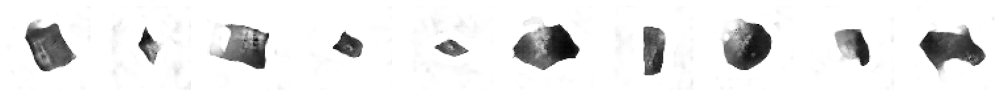

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2716 - d_real_acc: 0.9527 - d_fake_acc: 0.9549 - d_acc: 0.9538 - g_loss: 9.3735 - g_acc: 0.0450
Epoch 40/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3168 - d_real_acc: 0.9613 - d_fake_acc: 0.9631 - d_acc: 0.9622 - g_loss: 9.7631 - g_acc: 0.0369 
Saved to ./output/generated_img_039.png


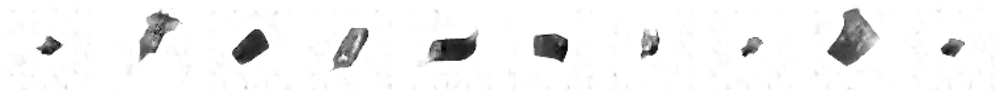

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3168 - d_real_acc: 0.9613 - d_fake_acc: 0.9631 - d_acc: 0.9622 - g_loss: 9.7631 - g_acc: 0.0369
Epoch 41/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3306 - d_real_acc: 0.9607 - d_fake_acc: 0.9614 - d_acc: 0.9611 - g_loss: 9.8524 - g_acc: 0.0386       
Saved to ./output/generated_img_040.png


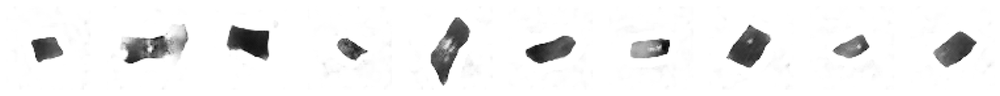

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3306 - d_real_acc: 0.9607 - d_fake_acc: 0.9614 - d_acc: 0.9611 - g_loss: 9.8524 - g_acc: 0.0386
Epoch 42/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2052 - d_real_acc: 0.9416 - d_fake_acc: 0.9492 - d_acc: 0.9454 - g_loss: 9.6501 - g_acc: 0.0508       
Saved to ./output/generated_img_041.png


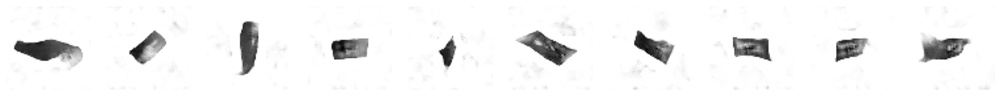

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2052 - d_real_acc: 0.9416 - d_fake_acc: 0.9492 - d_acc: 0.9454 - g_loss: 9.6501 - g_acc: 0.0508
Epoch 43/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3115 - d_real_acc: 0.9582 - d_fake_acc: 0.9585 - d_acc: 0.9583 - g_loss: 10.0133 - g_acc: 0.0415      
Saved to ./output/generated_img_042.png


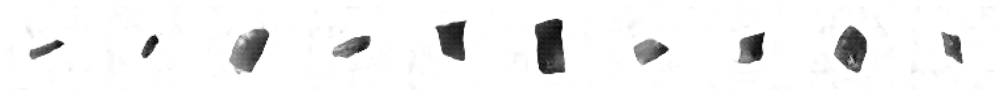

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3115 - d_real_acc: 0.9582 - d_fake_acc: 0.9585 - d_acc: 0.9583 - g_loss: 10.0133 - g_acc: 0.0415
Epoch 44/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3238 - d_real_acc: 0.9602 - d_fake_acc: 0.9612 - d_acc: 0.9607 - g_loss: 11.8553 - g_acc: 0.0388      
Saved to ./output/generated_img_043.png


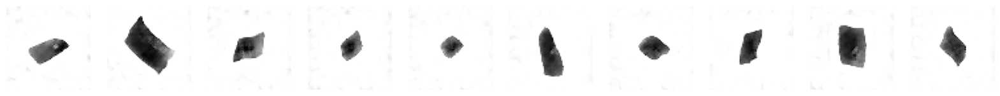

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3238 - d_real_acc: 0.9602 - d_fake_acc: 0.9612 - d_acc: 0.9607 - g_loss: 11.8553 - g_acc: 0.0388
Epoch 45/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2695 - d_real_acc: 0.9499 - d_fake_acc: 0.9498 - d_acc: 0.9499 - g_loss: 9.5646 - g_acc: 0.0502    
Saved to ./output/generated_img_044.png


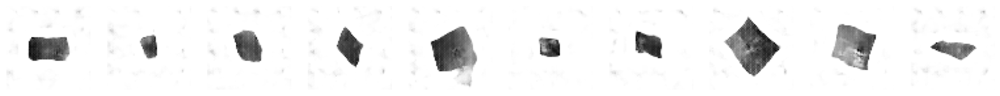

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2695 - d_real_acc: 0.9499 - d_fake_acc: 0.9498 - d_acc: 0.9499 - g_loss: 9.5646 - g_acc: 0.0502
Epoch 46/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3658 - d_real_acc: 0.9615 - d_fake_acc: 0.9637 - d_acc: 0.9626 - g_loss: 10.7343 - g_acc: 0.0363      
Saved to ./output/generated_img_045.png


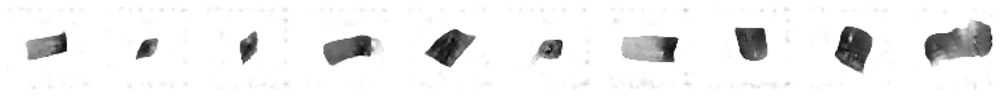

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3658 - d_real_acc: 0.9615 - d_fake_acc: 0.9637 - d_acc: 0.9626 - g_loss: 10.7343 - g_acc: 0.0363
Epoch 47/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3271 - d_real_acc: 0.9582 - d_fake_acc: 0.9640 - d_acc: 0.9611 - g_loss: 10.3744 - g_acc: 0.0360  
Saved to ./output/generated_img_046.png


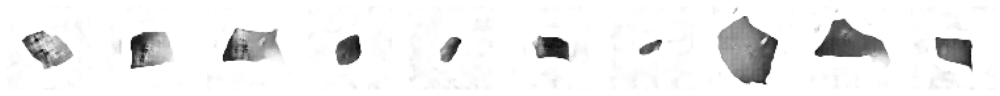

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3271 - d_real_acc: 0.9582 - d_fake_acc: 0.9640 - d_acc: 0.9611 - g_loss: 10.3744 - g_acc: 0.0360
Epoch 48/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0935 - d_real_acc: 0.9288 - d_fake_acc: 0.9352 - d_acc: 0.9320 - g_loss: 8.9545 - g_acc: 0.0649     
Saved to ./output/generated_img_047.png


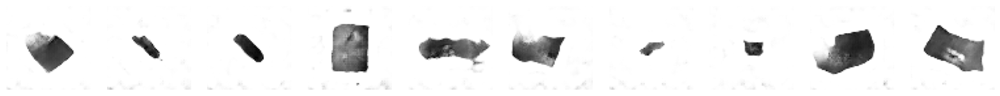

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0935 - d_real_acc: 0.9288 - d_fake_acc: 0.9352 - d_acc: 0.9320 - g_loss: 8.9545 - g_acc: 0.0649
Epoch 49/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3916 - d_real_acc: 0.9668 - d_fake_acc: 0.9702 - d_acc: 0.9685 - g_loss: 11.1061 - g_acc: 0.0298 
Saved to ./output/generated_img_048.png


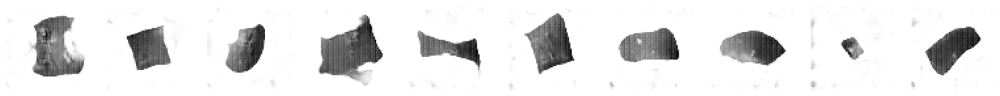

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3916 - d_real_acc: 0.9668 - d_fake_acc: 0.9702 - d_acc: 0.9685 - g_loss: 11.1061 - g_acc: 0.0298
Epoch 50/100
313/313 [==============================] - ETA: 0s - d_loss: -0.5958 - d_real_acc: 0.9824 - d_fake_acc: 0.9837 - d_acc: 0.9831 - g_loss: 13.7053 - g_acc: 0.0163      
Saved to ./output/generated_img_049.png


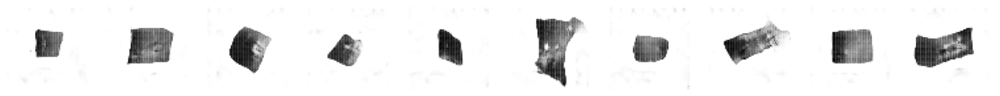

313/313 [==============================] - 40s 127ms/step - d_loss: -0.5958 - d_real_acc: 0.9824 - d_fake_acc: 0.9837 - d_acc: 0.9831 - g_loss: 13.7053 - g_acc: 0.0163
Epoch 51/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7662 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4237 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_050.png


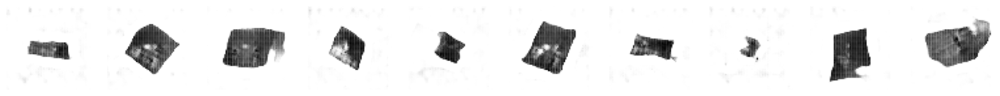

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7662 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4237 - g_acc: 0.0000e+00
Epoch 52/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7625 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.3903 - g_acc: 2.5000e-05  
Saved to ./output/generated_img_051.png


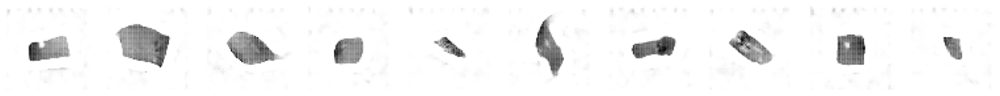

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7625 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.3903 - g_acc: 2.5000e-05
Epoch 53/100
313/313 [==============================] - ETA: 0s - d_loss: 0.2112 - d_real_acc: 0.8670 - d_fake_acc: 0.8644 - d_acc: 0.8658 - g_loss: 9.3966 - g_acc: 0.1356        
Saved to ./output/generated_img_052.png


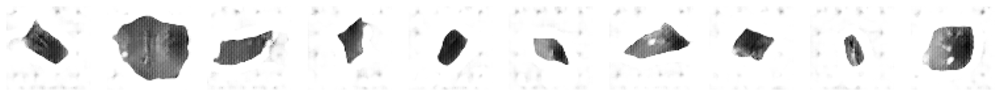

313/313 [==============================] - 40s 127ms/step - d_loss: 0.2112 - d_real_acc: 0.8670 - d_fake_acc: 0.8644 - d_acc: 0.8658 - g_loss: 9.3966 - g_acc: 0.1356
Epoch 54/100
313/313 [==============================] - ETA: 0s - d_loss: -0.6109 - d_real_acc: 0.9851 - d_fake_acc: 0.9863 - d_acc: 0.9857 - g_loss: 13.6459 - g_acc: 0.0137      
Saved to ./output/generated_img_053.png


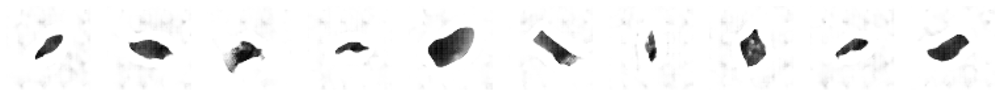

313/313 [==============================] - 40s 127ms/step - d_loss: -0.6109 - d_real_acc: 0.9851 - d_fake_acc: 0.9863 - d_acc: 0.9857 - g_loss: 13.6459 - g_acc: 0.0137
Epoch 55/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7629 - d_real_acc: 1.0000 - d_fake_acc: 0.9999 - d_acc: 0.9999 - g_loss: 15.3381 - g_acc: 7.5000e-05  
Saved to ./output/generated_img_054.png


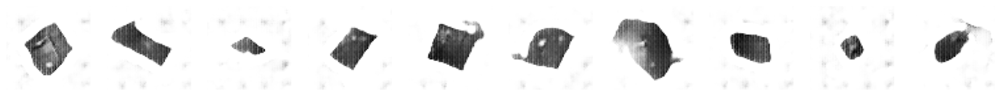

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7629 - d_real_acc: 1.0000 - d_fake_acc: 0.9999 - d_acc: 0.9999 - g_loss: 15.3381 - g_acc: 7.5000e-05
Epoch 56/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7686 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4242 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_055.png


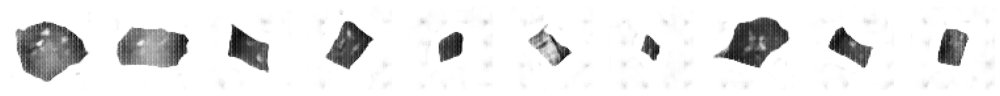

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7686 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4242 - g_acc: 0.0000e+00
Epoch 57/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7703 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4241 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_056.png


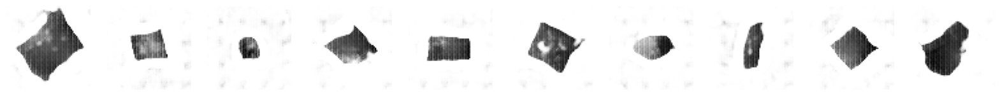

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7703 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4241 - g_acc: 0.0000e+00
Epoch 58/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7630 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.3891 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_057.png


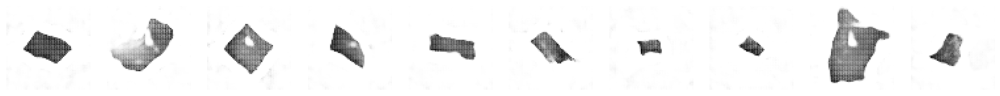

313/313 [==============================] - 40s 127ms/step - d_loss: -0.7630 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.3891 - g_acc: 0.0000e+00
Epoch 59/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7692 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_058.png


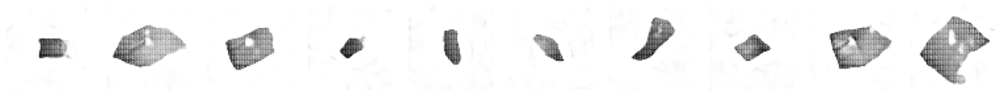

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7692 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Epoch 60/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7671 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_059.png


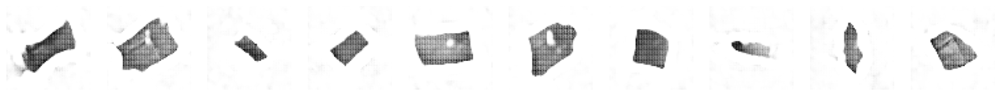

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7671 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Epoch 61/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7667 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_060.png


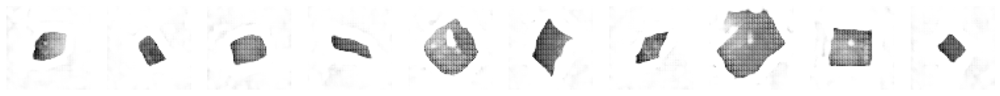

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7667 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Epoch 62/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7650 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_061.png


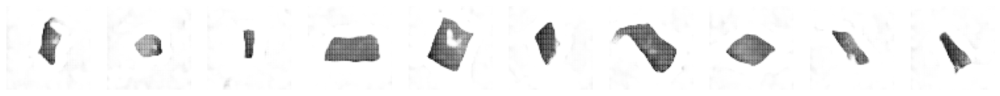

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7650 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Epoch 63/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7678 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_062.png


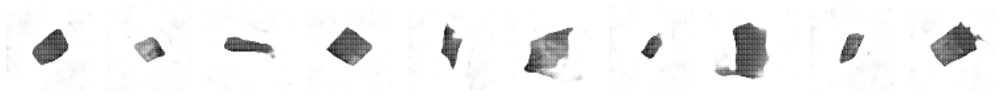

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7678 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Epoch 64/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7680 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_063.png


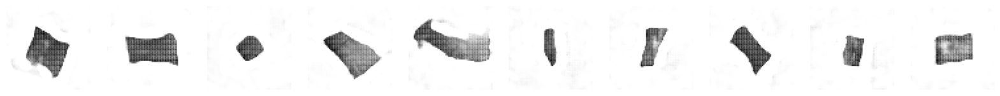

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7680 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Epoch 65/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7690 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_064.png


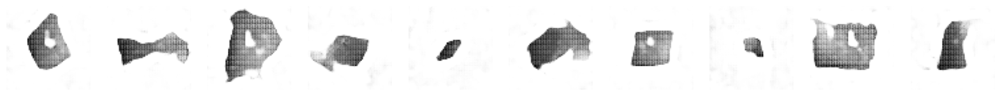

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7690 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Epoch 66/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7663 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_065.png


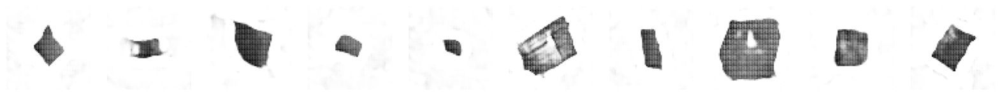

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7663 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Epoch 67/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7616 - d_real_acc: 0.9993 - d_fake_acc: 1.0000 - d_acc: 0.9997 - g_loss: 15.4119 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_066.png


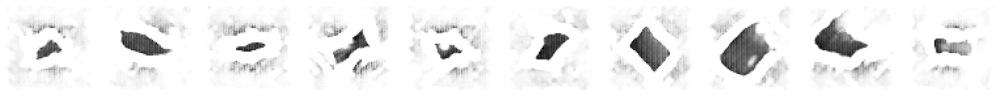

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7616 - d_real_acc: 0.9993 - d_fake_acc: 1.0000 - d_acc: 0.9997 - g_loss: 15.4119 - g_acc: 0.0000e+00
Epoch 68/100
313/313 [==============================] - ETA: 0s - d_loss: 1.7478 - d_real_acc: 0.5724 - d_fake_acc: 0.5270 - d_acc: 0.5497 - g_loss: 1.9629 - g_acc: 0.4730          
Saved to ./output/generated_img_067.png


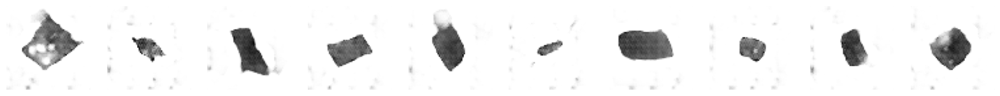

313/313 [==============================] - 40s 128ms/step - d_loss: 1.7478 - d_real_acc: 0.5724 - d_fake_acc: 0.5270 - d_acc: 0.5497 - g_loss: 1.9629 - g_acc: 0.4730
Epoch 69/100
313/313 [==============================] - ETA: 0s - d_loss: 0.8652 - d_real_acc: 0.6314 - d_fake_acc: 0.6310 - d_acc: 0.6312 - g_loss: 1.9664 - g_acc: 0.3690  
Saved to ./output/generated_img_068.png


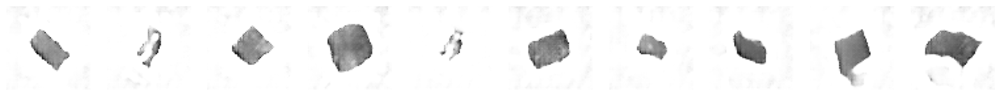

313/313 [==============================] - 40s 127ms/step - d_loss: 0.8652 - d_real_acc: 0.6314 - d_fake_acc: 0.6310 - d_acc: 0.6312 - g_loss: 1.9664 - g_acc: 0.3690
Epoch 70/100
313/313 [==============================] - ETA: 0s - d_loss: -0.0918 - d_real_acc: 0.9221 - d_fake_acc: 0.9265 - d_acc: 0.9243 - g_loss: 8.2609 - g_acc: 0.0735     
Saved to ./output/generated_img_069.png


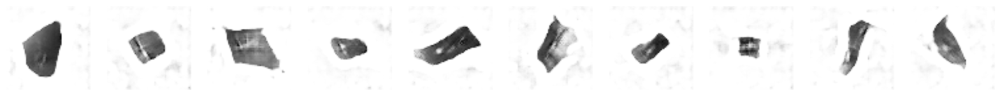

313/313 [==============================] - 40s 128ms/step - d_loss: -0.0918 - d_real_acc: 0.9221 - d_fake_acc: 0.9265 - d_acc: 0.9243 - g_loss: 8.2609 - g_acc: 0.0735
Epoch 71/100
313/313 [==============================] - ETA: 0s - d_loss: -0.1658 - d_real_acc: 0.9503 - d_fake_acc: 0.9468 - d_acc: 0.9486 - g_loss: 8.2817 - g_acc: 0.0532 
Saved to ./output/generated_img_070.png


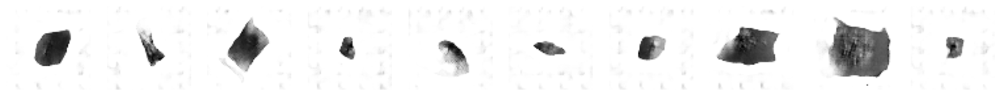

313/313 [==============================] - 40s 128ms/step - d_loss: -0.1658 - d_real_acc: 0.9503 - d_fake_acc: 0.9468 - d_acc: 0.9486 - g_loss: 8.2817 - g_acc: 0.0532
Epoch 72/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2694 - d_real_acc: 0.9552 - d_fake_acc: 0.9568 - d_acc: 0.9560 - g_loss: 8.8508 - g_acc: 0.0432  
Saved to ./output/generated_img_071.png


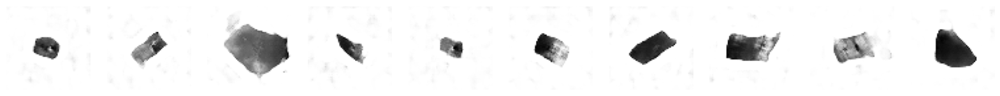

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2694 - d_real_acc: 0.9552 - d_fake_acc: 0.9568 - d_acc: 0.9560 - g_loss: 8.8508 - g_acc: 0.0432
Epoch 73/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2974 - d_real_acc: 0.9582 - d_fake_acc: 0.9589 - d_acc: 0.9585 - g_loss: 9.4685 - g_acc: 0.0411       
Saved to ./output/generated_img_072.png


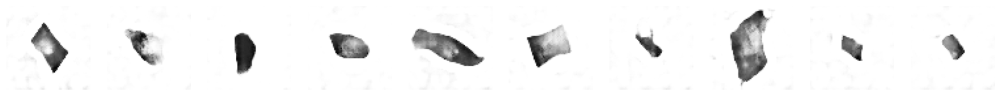

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2974 - d_real_acc: 0.9582 - d_fake_acc: 0.9589 - d_acc: 0.9585 - g_loss: 9.4685 - g_acc: 0.0411
Epoch 74/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2743 - d_real_acc: 0.9530 - d_fake_acc: 0.9561 - d_acc: 0.9546 - g_loss: 9.1763 - g_acc: 0.0439  
Saved to ./output/generated_img_073.png


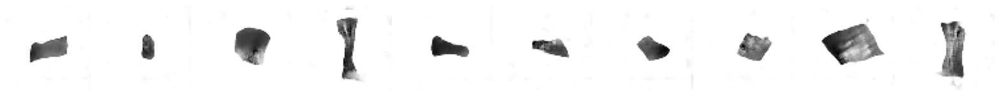

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2743 - d_real_acc: 0.9530 - d_fake_acc: 0.9561 - d_acc: 0.9546 - g_loss: 9.1763 - g_acc: 0.0439
Epoch 75/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3093 - d_real_acc: 0.9556 - d_fake_acc: 0.9595 - d_acc: 0.9575 - g_loss: 9.3780 - g_acc: 0.0405      
Saved to ./output/generated_img_074.png


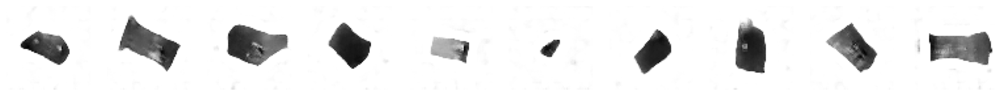

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3093 - d_real_acc: 0.9556 - d_fake_acc: 0.9595 - d_acc: 0.9575 - g_loss: 9.3780 - g_acc: 0.0405
Epoch 76/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3772 - d_real_acc: 0.9697 - d_fake_acc: 0.9708 - d_acc: 0.9703 - g_loss: 10.2055 - g_acc: 0.0291 
Saved to ./output/generated_img_075.png


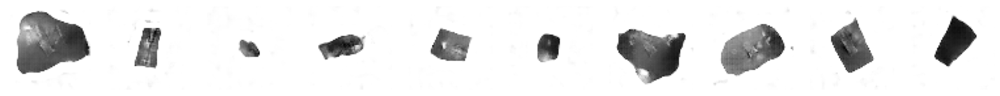

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3772 - d_real_acc: 0.9697 - d_fake_acc: 0.9708 - d_acc: 0.9703 - g_loss: 10.2055 - g_acc: 0.0291
Epoch 77/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3202 - d_real_acc: 0.9558 - d_fake_acc: 0.9606 - d_acc: 0.9582 - g_loss: 10.1046 - g_acc: 0.0395      
Saved to ./output/generated_img_076.png


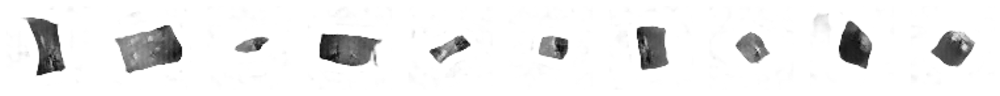

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3202 - d_real_acc: 0.9558 - d_fake_acc: 0.9606 - d_acc: 0.9582 - g_loss: 10.1046 - g_acc: 0.0395
Epoch 78/100
313/313 [==============================] - ETA: 0s - d_loss: -0.4041 - d_real_acc: 0.9636 - d_fake_acc: 0.9658 - d_acc: 0.9647 - g_loss: 11.0283 - g_acc: 0.0342      
Saved to ./output/generated_img_077.png


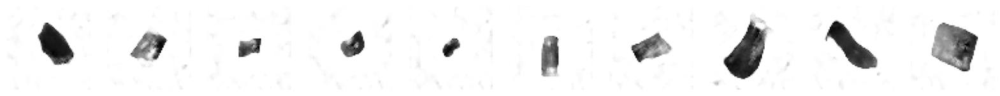

313/313 [==============================] - 40s 128ms/step - d_loss: -0.4041 - d_real_acc: 0.9636 - d_fake_acc: 0.9658 - d_acc: 0.9647 - g_loss: 11.0283 - g_acc: 0.0342
Epoch 79/100
313/313 [==============================] - ETA: 0s - d_loss: 3.9632 - d_real_acc: 0.4540 - d_fake_acc: 0.9628 - d_acc: 0.7084 - g_loss: 12.4397 - g_acc: 0.0372 
Saved to ./output/generated_img_078.png


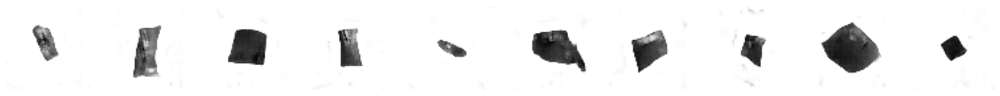

313/313 [==============================] - 40s 127ms/step - d_loss: 3.9632 - d_real_acc: 0.4540 - d_fake_acc: 0.9628 - d_acc: 0.7084 - g_loss: 12.4397 - g_acc: 0.0372
Epoch 80/100
313/313 [==============================] - ETA: 0s - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_079.png


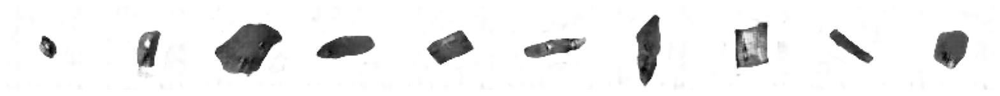

313/313 [==============================] - 40s 126ms/step - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 81/100
313/313 [==============================] - ETA: 0s - d_loss: 7.7118 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_080.png


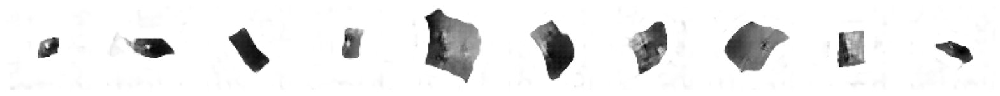

313/313 [==============================] - 40s 126ms/step - d_loss: 7.7118 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 82/100
313/313 [==============================] - ETA: 0s - d_loss: 3.7984 - d_real_acc: 0.4407 - d_fake_acc: 0.8810 - d_acc: 0.6608 - g_loss: 10.0392 - g_acc: 0.1190          
Saved to ./output/generated_img_081.png


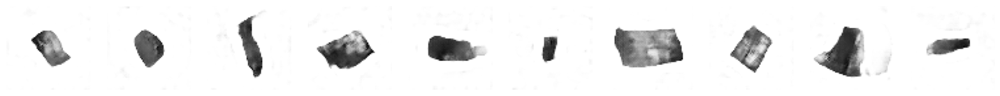

313/313 [==============================] - 40s 127ms/step - d_loss: 3.7984 - d_real_acc: 0.4407 - d_fake_acc: 0.8810 - d_acc: 0.6608 - g_loss: 10.0392 - g_acc: 0.1190
Epoch 83/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2760 - d_real_acc: 0.9520 - d_fake_acc: 0.9621 - d_acc: 0.9570 - g_loss: 10.1852 - g_acc: 0.0379   
Saved to ./output/generated_img_082.png


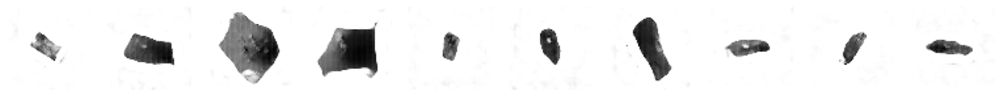

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2760 - d_real_acc: 0.9520 - d_fake_acc: 0.9621 - d_acc: 0.9570 - g_loss: 10.1852 - g_acc: 0.0379
Epoch 84/100
313/313 [==============================] - ETA: 0s - d_loss: -0.2836 - d_real_acc: 0.9492 - d_fake_acc: 0.9497 - d_acc: 0.9495 - g_loss: 9.6861 - g_acc: 0.0503 
Saved to ./output/generated_img_083.png


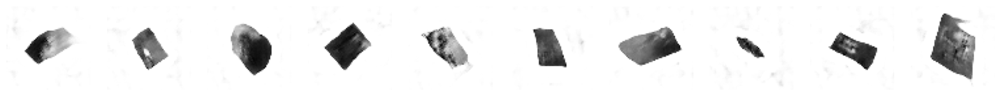

313/313 [==============================] - 40s 128ms/step - d_loss: -0.2836 - d_real_acc: 0.9492 - d_fake_acc: 0.9497 - d_acc: 0.9495 - g_loss: 9.6861 - g_acc: 0.0503
Epoch 85/100
313/313 [==============================] - ETA: 0s - d_loss: -0.6365 - d_real_acc: 0.9922 - d_fake_acc: 0.9917 - d_acc: 0.9920 - g_loss: 13.4415 - g_acc: 0.0083  
Saved to ./output/generated_img_084.png


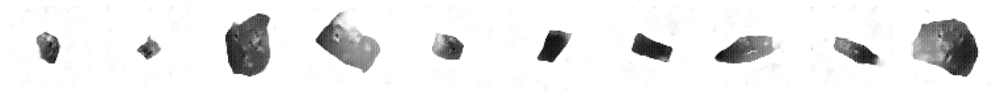

313/313 [==============================] - 40s 128ms/step - d_loss: -0.6365 - d_real_acc: 0.9922 - d_fake_acc: 0.9917 - d_acc: 0.9920 - g_loss: 13.4415 - g_acc: 0.0083
Epoch 86/100
313/313 [==============================] - ETA: 0s - d_loss: -0.4612 - d_real_acc: 0.9704 - d_fake_acc: 0.9713 - d_acc: 0.9708 - g_loss: 11.9091 - g_acc: 0.0287      
Saved to ./output/generated_img_085.png


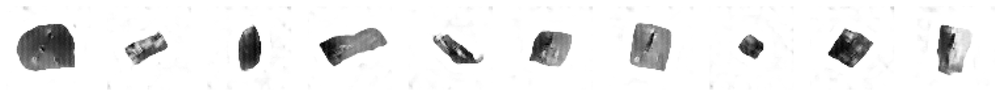

313/313 [==============================] - 40s 128ms/step - d_loss: -0.4612 - d_real_acc: 0.9704 - d_fake_acc: 0.9713 - d_acc: 0.9708 - g_loss: 11.9091 - g_acc: 0.0287
Epoch 87/100
313/313 [==============================] - ETA: 0s - d_loss: -0.4384 - d_real_acc: 0.9678 - d_fake_acc: 0.9709 - d_acc: 0.9694 - g_loss: 11.0920 - g_acc: 0.0291      
Saved to ./output/generated_img_086.png


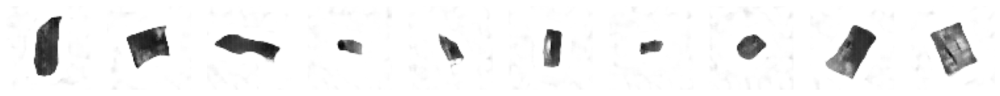

313/313 [==============================] - 40s 128ms/step - d_loss: -0.4384 - d_real_acc: 0.9678 - d_fake_acc: 0.9709 - d_acc: 0.9694 - g_loss: 11.0920 - g_acc: 0.0291
Epoch 88/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3222 - d_real_acc: 0.9512 - d_fake_acc: 0.9577 - d_acc: 0.9545 - g_loss: 11.5845 - g_acc: 0.0423      
Saved to ./output/generated_img_087.png


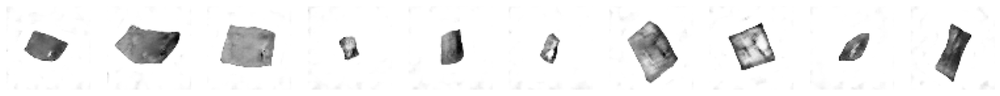

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3222 - d_real_acc: 0.9512 - d_fake_acc: 0.9577 - d_acc: 0.9545 - g_loss: 11.5845 - g_acc: 0.0423
Epoch 89/100
313/313 [==============================] - ETA: 0s - d_loss: -0.6963 - d_real_acc: 0.9947 - d_fake_acc: 0.9945 - d_acc: 0.9946 - g_loss: 14.3325 - g_acc: 0.0055 
Saved to ./output/generated_img_088.png


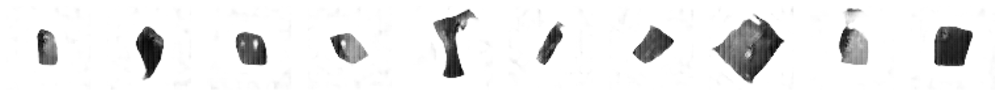

313/313 [==============================] - 40s 127ms/step - d_loss: -0.6963 - d_real_acc: 0.9947 - d_fake_acc: 0.9945 - d_acc: 0.9946 - g_loss: 14.3325 - g_acc: 0.0055
Epoch 90/100
313/313 [==============================] - ETA: 0s - d_loss: -0.4098 - d_real_acc: 0.9653 - d_fake_acc: 0.9690 - d_acc: 0.9671 - g_loss: 11.4830 - g_acc: 0.0310      
Saved to ./output/generated_img_089.png


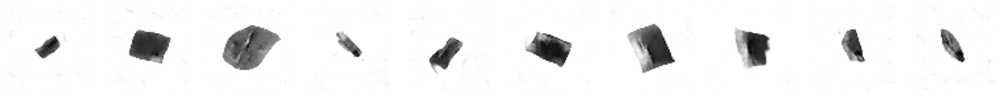

313/313 [==============================] - 40s 128ms/step - d_loss: -0.4098 - d_real_acc: 0.9653 - d_fake_acc: 0.9690 - d_acc: 0.9671 - g_loss: 11.4830 - g_acc: 0.0310
Epoch 91/100
313/313 [==============================] - ETA: 0s - d_loss: -0.3554 - d_real_acc: 0.9572 - d_fake_acc: 0.9614 - d_acc: 0.9593 - g_loss: 10.7478 - g_acc: 0.0386      
Saved to ./output/generated_img_090.png


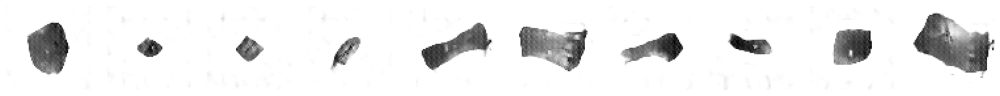

313/313 [==============================] - 40s 128ms/step - d_loss: -0.3554 - d_real_acc: 0.9572 - d_fake_acc: 0.9614 - d_acc: 0.9593 - g_loss: 10.7478 - g_acc: 0.0386
Epoch 92/100
313/313 [==============================] - ETA: 0s - d_loss: -0.4807 - d_real_acc: 0.9732 - d_fake_acc: 0.9731 - d_acc: 0.9732 - g_loss: 12.1050 - g_acc: 0.0269      
Saved to ./output/generated_img_091.png


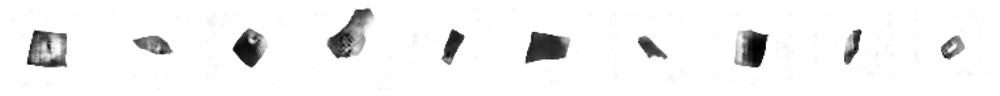

313/313 [==============================] - 40s 128ms/step - d_loss: -0.4807 - d_real_acc: 0.9732 - d_fake_acc: 0.9731 - d_acc: 0.9732 - g_loss: 12.1050 - g_acc: 0.0269
Epoch 93/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7606 - d_real_acc: 0.9998 - d_fake_acc: 0.9998 - d_acc: 0.9998 - g_loss: 15.3182 - g_acc: 2.0000e-04 
Saved to ./output/generated_img_092.png


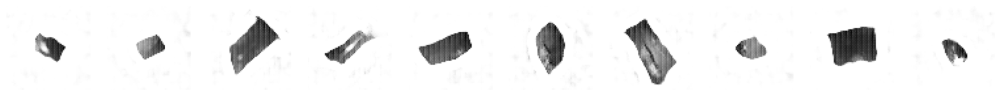

313/313 [==============================] - 40s 127ms/step - d_loss: -0.7606 - d_real_acc: 0.9998 - d_fake_acc: 0.9998 - d_acc: 0.9998 - g_loss: 15.3182 - g_acc: 2.0000e-04
Epoch 94/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7673 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4245 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_093.png


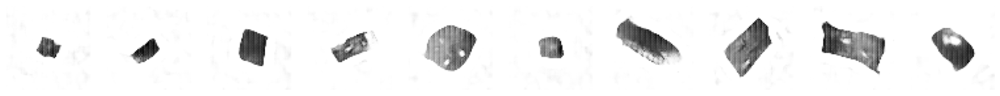

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7673 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4245 - g_acc: 0.0000e+00
Epoch 95/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7642 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4244 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_094.png


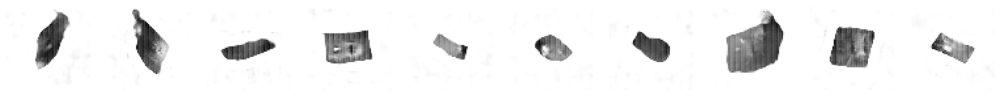

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7642 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4244 - g_acc: 0.0000e+00
Epoch 96/100
313/313 [==============================] - ETA: 0s - d_loss: -0.6681 - d_real_acc: 0.9911 - d_fake_acc: 0.9931 - d_acc: 0.9921 - g_loss: 15.2390 - g_acc: 0.0069      
Saved to ./output/generated_img_095.png


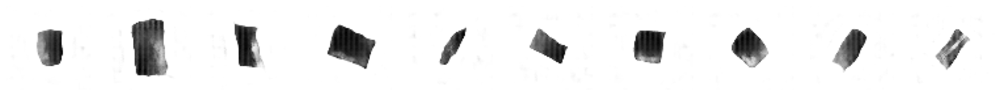

313/313 [==============================] - 40s 126ms/step - d_loss: -0.6681 - d_real_acc: 0.9911 - d_fake_acc: 0.9931 - d_acc: 0.9921 - g_loss: 15.2390 - g_acc: 0.0069
Epoch 97/100
313/313 [==============================] - ETA: 0s - d_loss: 0.0914 - d_real_acc: 0.9244 - d_fake_acc: 0.8770 - d_acc: 0.9007 - g_loss: 11.7080 - g_acc: 0.1230  
Saved to ./output/generated_img_096.png


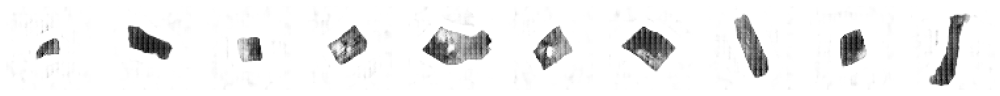

313/313 [==============================] - 40s 127ms/step - d_loss: 0.0914 - d_real_acc: 0.9244 - d_fake_acc: 0.8770 - d_acc: 0.9007 - g_loss: 11.7080 - g_acc: 0.1230
Epoch 98/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7688 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4246 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_097.png


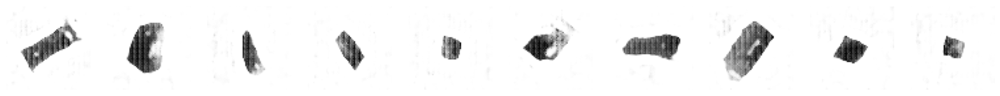

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7688 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4246 - g_acc: 0.0000e+00
Epoch 99/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7687 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4243 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_098.png


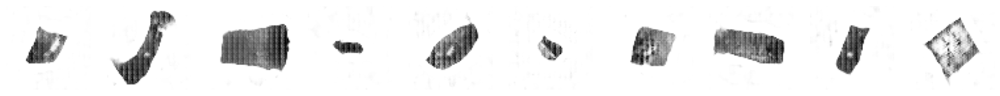

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7687 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4243 - g_acc: 0.0000e+00
Epoch 100/100
313/313 [==============================] - ETA: 0s - d_loss: -0.7670 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4245 - g_acc: 0.0000e+00  
Saved to ./output/generated_img_099.png


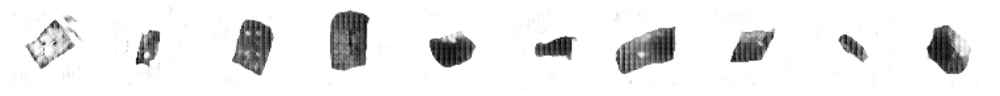

313/313 [==============================] - 40s 126ms/step - d_loss: -0.7670 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4245 - g_acc: 0.0000e+00


In [14]:
dcgan.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [15]:
# Save the final models
generator.save("./models/generator")
discriminator.save("./models/discriminator")

INFO:tensorflow:Assets written to: ./models/generator\assets


INFO:tensorflow:Assets written to: ./models/generator\assets


INFO:tensorflow:Assets written to: ./models/discriminator\assets


INFO:tensorflow:Assets written to: ./models/discriminator\assets


## 3. Generate new images <a name="decode"></a>

In [16]:
# Sample some points in the latent space, from the standard normal distribution
grid_width, grid_height = (10, 3)
z_sample = np.random.normal(size=(grid_width * grid_height, Z_DIM))

In [17]:
# Decode the sampled points
reconstructions = generator.predict(z_sample)

1/1 [==============================] - 1s 573ms/step


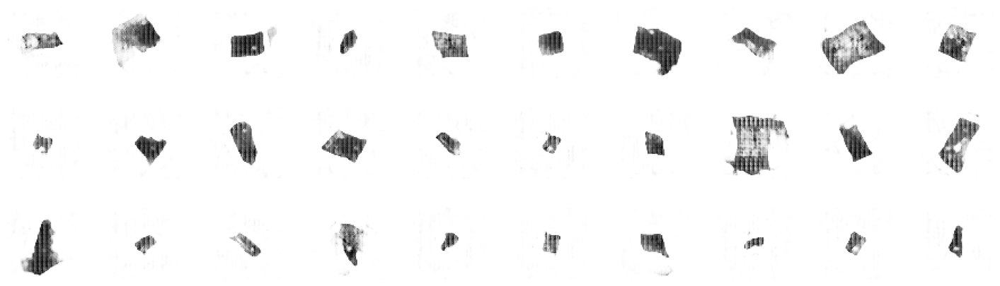

In [18]:
# Draw a plot of decoded images
fig = plt.figure(figsize=(18, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Output the grid of faces
for i in range(grid_width * grid_height):
    ax = fig.add_subplot(grid_height, grid_width, i + 1)
    ax.axis("off")
    ax.imshow(reconstructions[i, :, :], cmap="Greys")

In [19]:
def compare_images(img1, img2):
    return np.mean(np.abs(img1 - img2))

In [20]:
all_data = []
for i in train.as_numpy_iterator():
    all_data.extend(i)
all_data = np.array(all_data)

1/1 [==============================] - 0s 314ms/step


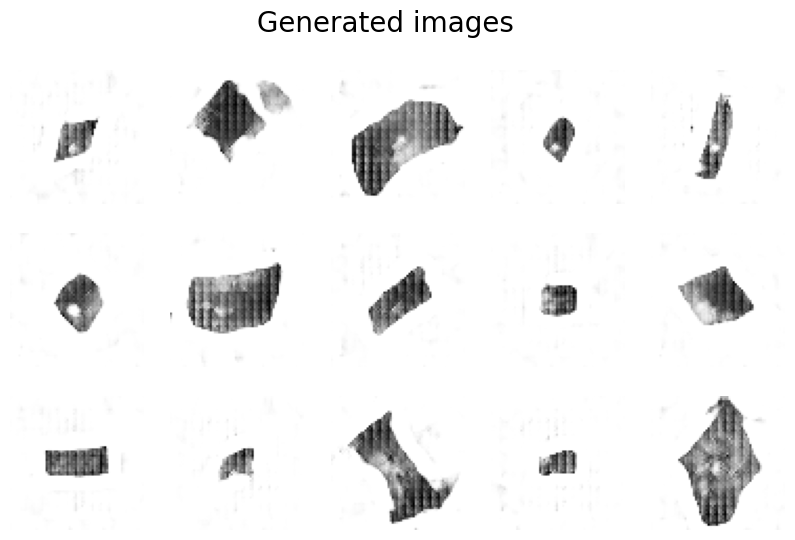

In [21]:
r, c = 3, 5
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Generated images", fontsize=20)

noise = np.random.normal(size=(r * c, Z_DIM))
gen_imgs = generator.predict(noise)

cnt = 0
for i in range(r):
    for j in range(c):
        axs[i, j].imshow(gen_imgs[cnt], cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()

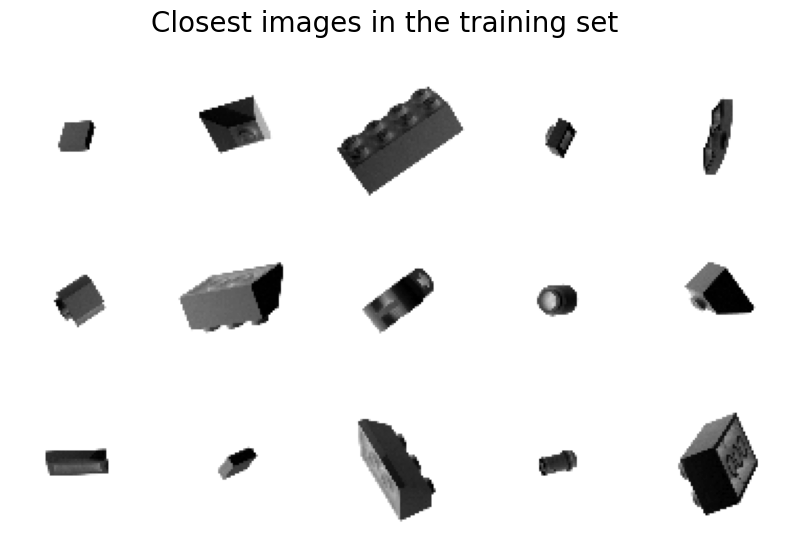

In [22]:
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Closest images in the training set", fontsize=20)

cnt = 0
for i in range(r):
    for j in range(c):
        c_diff = 99999
        c_img = None
        for k_idx, k in enumerate(all_data):
            diff = compare_images(gen_imgs[cnt], k)
            if diff < c_diff:
                c_img = np.copy(k)
                c_diff = diff
        axs[i, j].imshow(c_img, cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()